# check GPU

In [ ]:
!nvidia-smi

Thu Feb 20 09:56:03 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   47C    P8             10W /   70W |       0MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

# install and import ultralytics

In [ ]:
!pip install ultralytics
import ultralytics
ultralytics.checks()


Ultralytics 8.3.77 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 33.2/112.6 GB disk)


In [ ]:
from ultralytics import YOLO
from IPython.display import display, Image

# import dataset from roboflow

In [ ]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="vhRwYqEvUnzqPY2tP4oJ")
project = rf.workspace("dataset-skin").project("skin-disease-dataset")
version = project.version(38)
dataset = version.download("yolov11")



   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 83.1/83.1 kB 7.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 5.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.9/49.9 MB 13.8 MB/s eta 0:00:00
  Attempting uninstall: opencv-python-headless
    Found existing installation: opencv-python-headless 4.11.0.86
    Uninstalling opencv-python-headless-4.11.0.86:
      Successfully uninstalled opencv-python-headless-4.11.0.86
  Attempting uninstall: idna
    Found existing installation: idna 3.10
    Uninstalling idna-3.10:
      Successfully uninstalled idna-3.10


loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to skin-disease-dataset--38 in yolov11:: 100%|██████████| 18196/18196 [00:02<00:00, 6272.54it/s]


# Train model

In [ ]:
from ultralytics import YOLO

model = YOLO('yolo11n-seg.pt') # the model we have used which is yolo11.seg


train_result = model.train(
    data='/content/skin-disease-dataset--38/data.yaml', # yaml file in which defined path of images
    epochs=10, # epochs mean how much time our model train data
    imgsz=640, # image size is generaly used like that
    batch=32,# batch size that will enter in traning
)

Ultralytics 8.3.77 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=segment, mode=train, model=yolo11n-seg.pt, data=/content/skin-disease-dataset--38/data.yaml, epochs=10, time=None, patience=100, batch=32, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show

100%|██████████| 755k/755k [00:00<00:00, 80.0MB/s]


Overriding model.yaml nc=80 with nc=19

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      6640  ultralytics.nn.modules.block.C3k2            [32, 64, 1, False, 0.25]      
  3                  -1  1     36992  ultralytics.nn.modules.conv.Conv             [64, 64, 3, 2]                
  4                  -1  1     26080  ultralytics.nn.modules.block.C3k2            [64, 128, 1, False, 0.25]     
  5                  -1  1    147712  ultralytics.nn.modules.conv.Conv             [128, 128, 3, 2]              
  6                  -1  1     87040  ultralytics.nn.modules.block.C3k2            [128, 128, 1, True]           
  7                  -1  1    295424  ultralytic

100%|██████████| 5.35M/5.35M [00:00<00:00, 226MB/s]


AMP: checks passed ✅


train: Scanning /content/skin-disease-dataset--38/train/labels... 8070 images, 9 backgrounds, 0 corrupt: 100%|██████████| 8070/8070 [00:05<00:00, 1558.84it/s]


train: New cache created: /content/skin-disease-dataset--38/train/labels.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Scanning /content/skin-disease-dataset--38/valid/labels... 658 images, 1 backgrounds, 0 corrupt: 100%|██████████| 658/658 [00:01<00:00, 536.77it/s]


val: New cache created: /content/skin-disease-dataset--38/valid/labels.cache
Plotting labels to runs/segment/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000435, momentum=0.9) with parameter groups 90 weight(decay=0.0), 101 weight(decay=0.0005), 100 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/segment/train
Starting training for 10 epochs...
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       1/10      10.9G       1.52      2.488      4.052      1.287         43        640: 100%|██████████| 253/253 [03:19<00:00,  1.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:10<00:00,  1.02it/s]


                   all        658       2609      0.308      0.303      0.222      0.145      0.306      0.299       0.22      0.141

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       2/10      12.3G      1.468      2.196      2.714      1.243         50        640: 100%|██████████| 253/253 [03:12<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:09<00:00,  1.11it/s]


                   all        658       2609      0.333      0.422      0.345       0.22      0.363      0.394      0.349      0.218

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       3/10      10.3G      1.427      2.125       2.33      1.207        126        640: 100%|██████████| 253/253 [03:11<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:10<00:00,  1.08it/s]


                   all        658       2609      0.467      0.406      0.378      0.255      0.466      0.408      0.381      0.234

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       4/10      8.92G      1.408      2.091      2.095      1.194          6        640: 100%|██████████| 253/253 [03:12<00:00,  1.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:09<00:00,  1.12it/s]


                   all        658       2609      0.489      0.499      0.482      0.309      0.491      0.499      0.486      0.284

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       5/10        13G      1.379      2.031      1.847      1.175         12        640: 100%|██████████| 253/253 [03:09<00:00,  1.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:09<00:00,  1.16it/s]


                   all        658       2609      0.593      0.504      0.546      0.368      0.596      0.505      0.551      0.343

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       6/10      10.6G      1.339      1.974      1.656      1.146         78        640: 100%|██████████| 253/253 [03:11<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:10<00:00,  1.05it/s]


                   all        658       2609      0.562      0.511       0.53      0.356      0.575      0.502      0.532      0.329

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       7/10      13.2G      1.309      1.926      1.526      1.126         40        640: 100%|██████████| 253/253 [03:12<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:09<00:00,  1.20it/s]

                   all        658       2609      0.597      0.562      0.572      0.388      0.596      0.559      0.572      0.367



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       8/10      10.1G      1.274      1.869      1.392      1.109          7        640: 100%|██████████| 253/253 [03:08<00:00,  1.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:09<00:00,  1.13it/s]

                   all        658       2609      0.568      0.605      0.613      0.411      0.595      0.588      0.614      0.376



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       9/10      9.44G       1.25      1.834      1.304      1.094         28        640: 100%|██████████| 253/253 [03:06<00:00,  1.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:10<00:00,  1.07it/s]

                   all        658       2609      0.627      0.623      0.645      0.435      0.654      0.603      0.646      0.406



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      10/10      11.1G      1.219      1.795      1.215      1.073         18        640: 100%|██████████| 253/253 [03:07<00:00,  1.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:09<00:00,  1.15it/s]

                   all        658       2609      0.663      0.637      0.652      0.455      0.672      0.637      0.659      0.424



10 epochs completed in 0.565 hours.
Optimizer stripped from runs/segment/train/weights/last.pt, 6.0MB
Optimizer stripped from runs/segment/train/weights/best.pt, 6.0MB

Validating runs/segment/train/weights/best.pt...
Ultralytics 8.3.77 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLO11n-seg summary (fused): 113 layers, 2,838,273 parameters, 0 gradients, 10.2 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:15<00:00,  1.43s/it]


                   all        658       2609       0.66       0.64      0.651      0.454      0.671      0.637      0.659      0.423
      Darier_s-Disease         28         31      0.565      0.645      0.581      0.391      0.571      0.645      0.584       0.34
Epidermolysis-Bullosa-Pruriginosa         16        136      0.465      0.654      0.524      0.284      0.491      0.669      0.562      0.257
 Hailey-Hailey-Disease         19         30      0.656      0.533      0.531      0.406      0.704      0.567      0.608      0.376
            Hemangiome         20         61      0.886      0.639      0.758      0.571      0.885       0.63      0.781       0.49
              Impetigo         34        108      0.461      0.528      0.406      0.249      0.474      0.528      0.423       0.22
           Leishmanios         17         43      0.554      0.442      0.479      0.304      0.555      0.436      0.476      0.308
Lupus-Erythematosus-Chronicus-Discoides         23        

# Analyze model performance

In [ ]:
import pandas as pd
df=pd.read_csv('/content/runs/segment/train/results.csv')
display(df)

,epoch,time,train/box_loss,train/seg_loss,train/cls_loss,train/dfl_loss,metrics/precision(B),metrics/recall(B),metrics/mAP50(B),metrics/mAP50-95(B),...,metrics/recall(M),metrics/mAP50(M),metrics/mAP50-95(M),val/box_loss,val/seg_loss,val/cls_loss,val/dfl_loss,lr/pg0,lr/pg1,lr/pg2
0,1,217.867,1.52048,2.48755,4.05224,1.28682,0.30822,0.30337,0.22207,0.14536,...,0.29915,0.21951,0.14104,1.35920,1.97621,2.67935,1.29700,0.000144,0.000144,0.000144
1,2,421.645,1.46805,2.19612,2.71385,1.24343,0.33311,0.42230,0.34456,0.22030,...,0.39356,0.34873,0.21786,1.35273,1.90112,2.28663,1.27581,0.000261,0.000261,0.000261
2,3,625.037,1.42689,2.12450,2.32982,1.20693,0.46742,0.40576,0.37806,0.25533,...,0.40816,0.38071,0.23445,1.27961,1.90474,2.08765,1.22784,0.000348,0.000348,0.000348
3,4,828.533,1.40769,2.09059,2.09497,1.19426,0.48911,0.49891,0.48166,0.30907,...,0.49857,0.48590,0.28414,1.29120,1.86859,1.86040,1.22546,0.000306,0.000306,0.000306
4,5,1029.500,1.37873,2.03078,1.84704,1.17482,0.59304,0.50377,0.54607,0.36823,...,0.50484,0.55129,0.34314,1.20395,1.76704,1.62919,1.17766,0.000263,0.000263,0.000263
5,6,1233.060,1.33940,1.97381,1.65624,1.14628,0.56209,0.51079,0.52973,0.35579,...,0.50201,0.53223,0.32925,1.22054,1.74672,1.65233,1.18797,0.000220,0.000220,0.000220
6,7,1435.410,1.30924,1.92576,1.52640,1.12623,0.59726,0.56237,0.57177,0.38820,...,0.55930,0.57150,0.36673,1.18850,1.67727,1.49201,1.14641,0.000177,0.000177,0.000177
7,8,1634.810,1.27358,1.86921,1.39241,1.10884,0.56815,0.60510,0.61296,0.41058,...,0.58822,0.61416,0.37617,1.16992,1.66599,1.37164,1.13344,0.000134,0.000134,0.000134
8,9,1832.610,1.24970,1.83393,1.30359,1.09352,0.62664,0.62252,0.64515,0.43516,...,0.60255,0.64626,0.40634,1.11931,1.62431,1.37451,1.11331,0.000090,0.000090,0.000090
9,10,2031.240,1.21922,1.79508,1.21521,1.07333,0.66312,0.63741,0.65226,0.45462,...,0.63685,0.65936,0.42440,1.10904,1.60352,1.29225,1.10496,0.000047,0.000047,0.000047


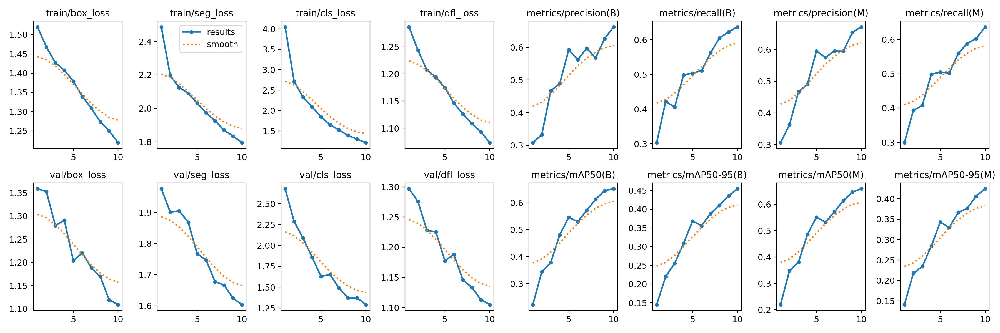

In [ ]:
Image(filename='/content/runs/segment/train/results.png', width=900)

# Confusion matrix

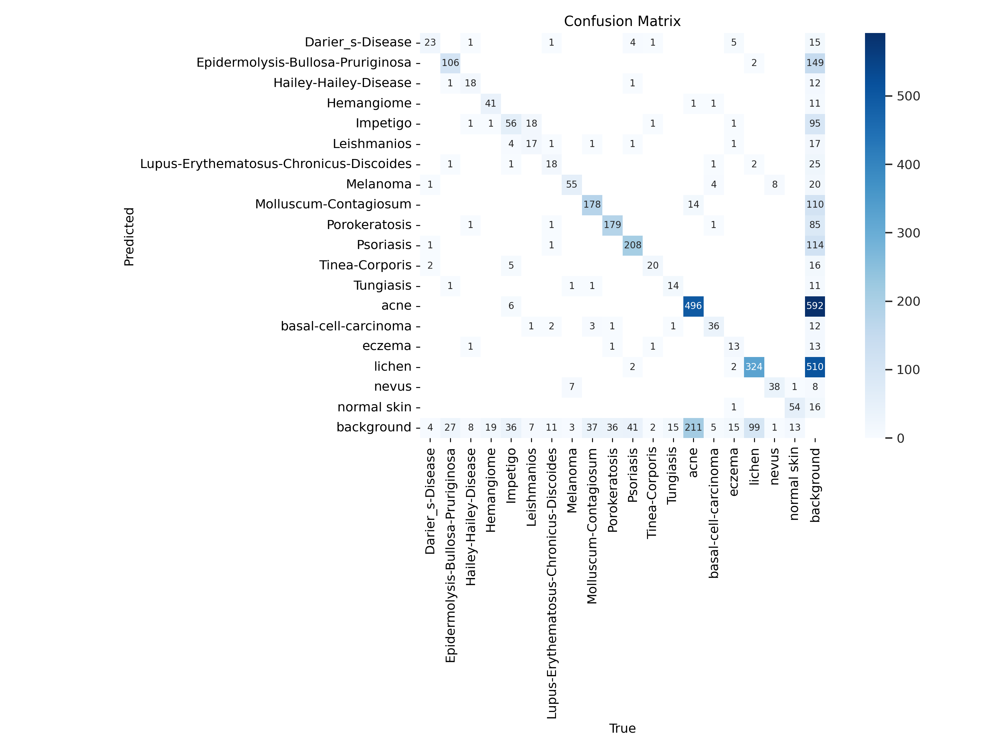

In [ ]:
Image(filename='/content/runs/segment/train/confusion_matrix.png', width=700)

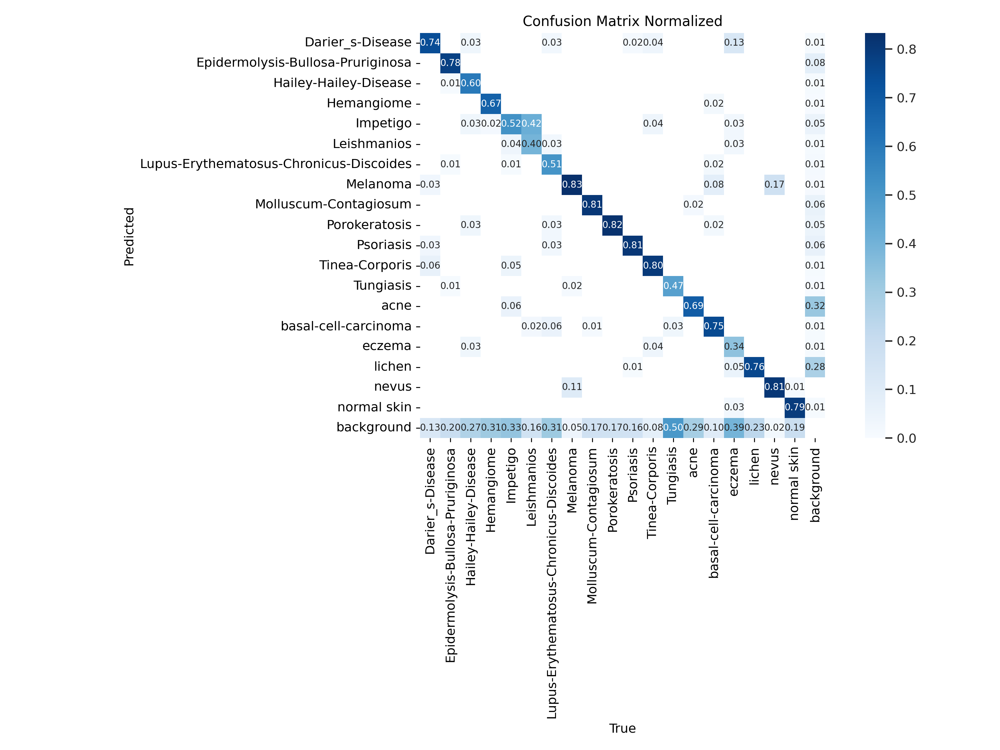

In [ ]:
Image(filename='/content/runs/segment/train/confusion_matrix_normalized.png', width=700)

# F1 score
 The F1 score (or F1-measure) is a metric used to evaluate the performance of a classification model, especially when you have an imbalanced dataset. It’s the harmonic mean of precision and recall, giving a balance between the two.

Formula:
F1 Score
=
2
⋅
Precision
⋅
Recall
Precision
+
Recall
F1 Score=2⋅
Precision+Recall
Precision⋅Recall
​


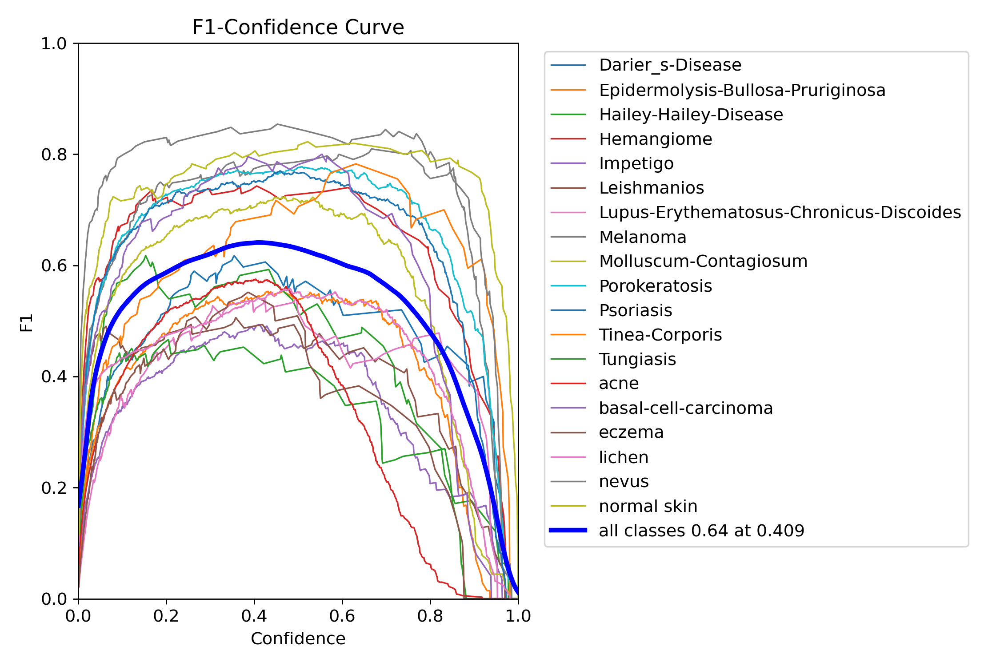

In [ ]:
Image(filename='/content/runs/segment/train/BoxF1_curve.png', width=700)

# precision_Recall
Precision tells you how many of the predicted positives are actually correct.

Formula:

Precision
=
True Positives (TP)
True Positives (TP)
+
False Positives (FP)
Precision=
True Positives (TP)+False Positives (FP)
True Positives (TP)
​
# Recall
Recall tells you how many of the actual positives your model correctly predicted.

Formula:

Recall
=
True Positives (TP)
True Positives (TP)
+
False Negatives (FN)
Recall=
True Positives (TP)+False Negatives (FN)
True Positives (TP)
​



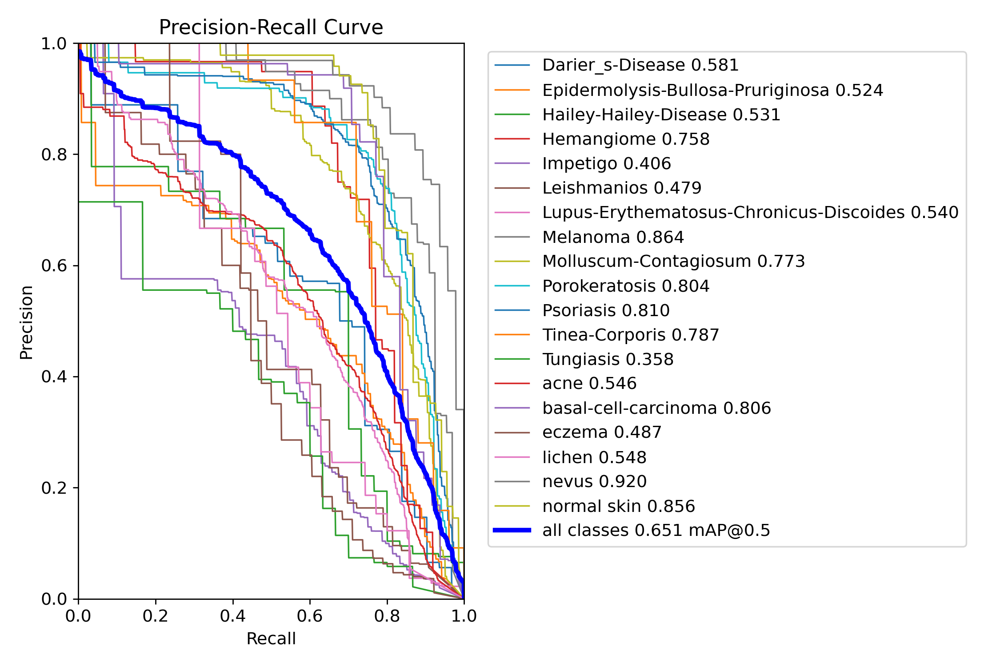

In [ ]:
Image(filename='/content/runs/segment/train/BoxPR_curve.png', width=700)

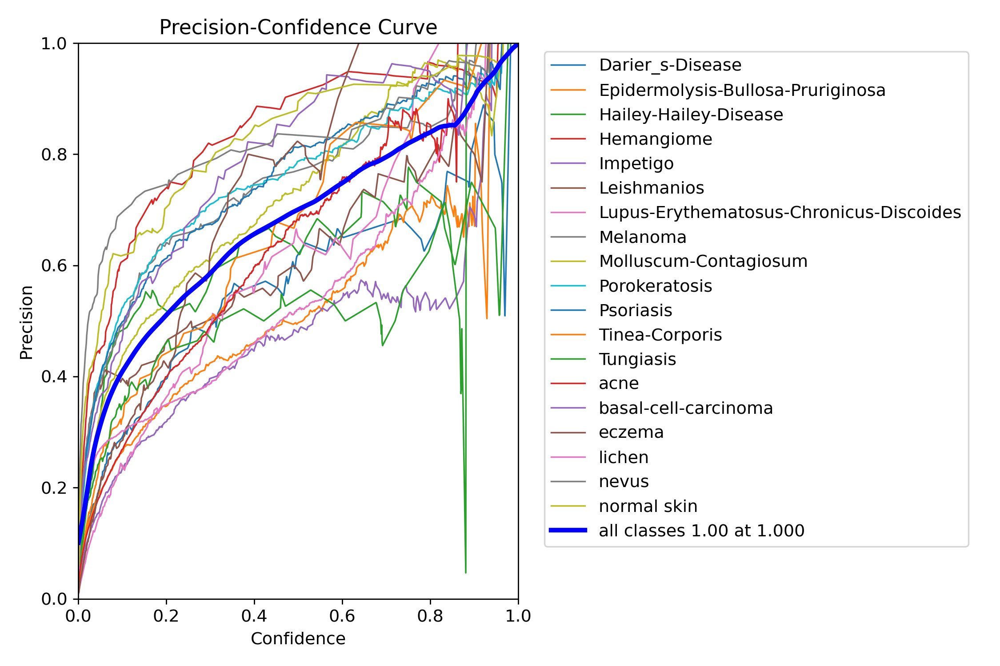

In [ ]:
Image(filename='/content/runs/segment/train/BoxP_curve.png', width=700)

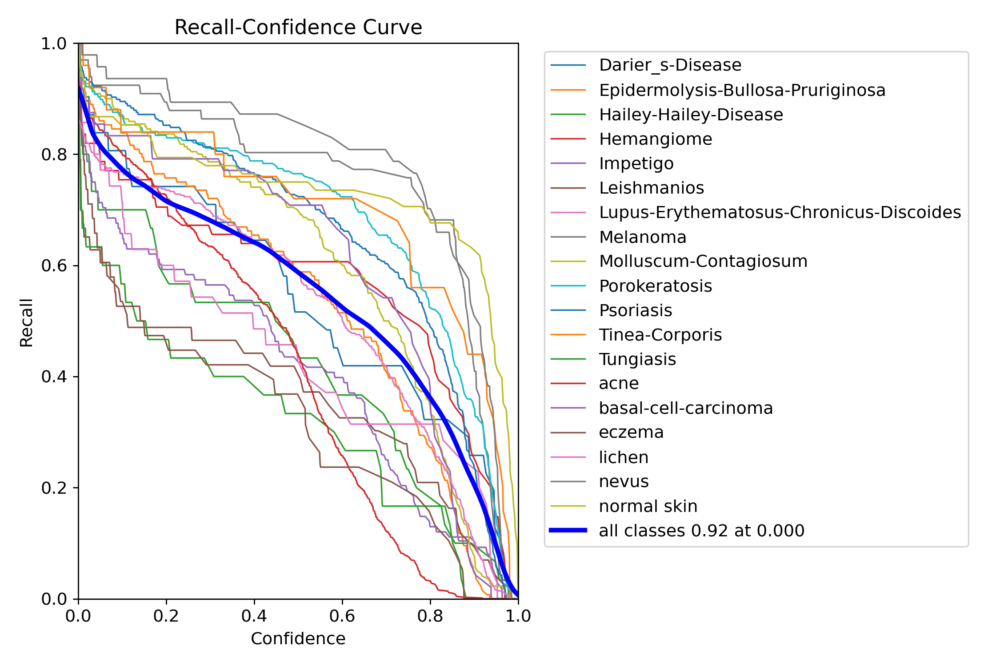

In [ ]:
Image(filename='/content/runs/segment/train/BoxR_curve.png', width=700)

# Training batch

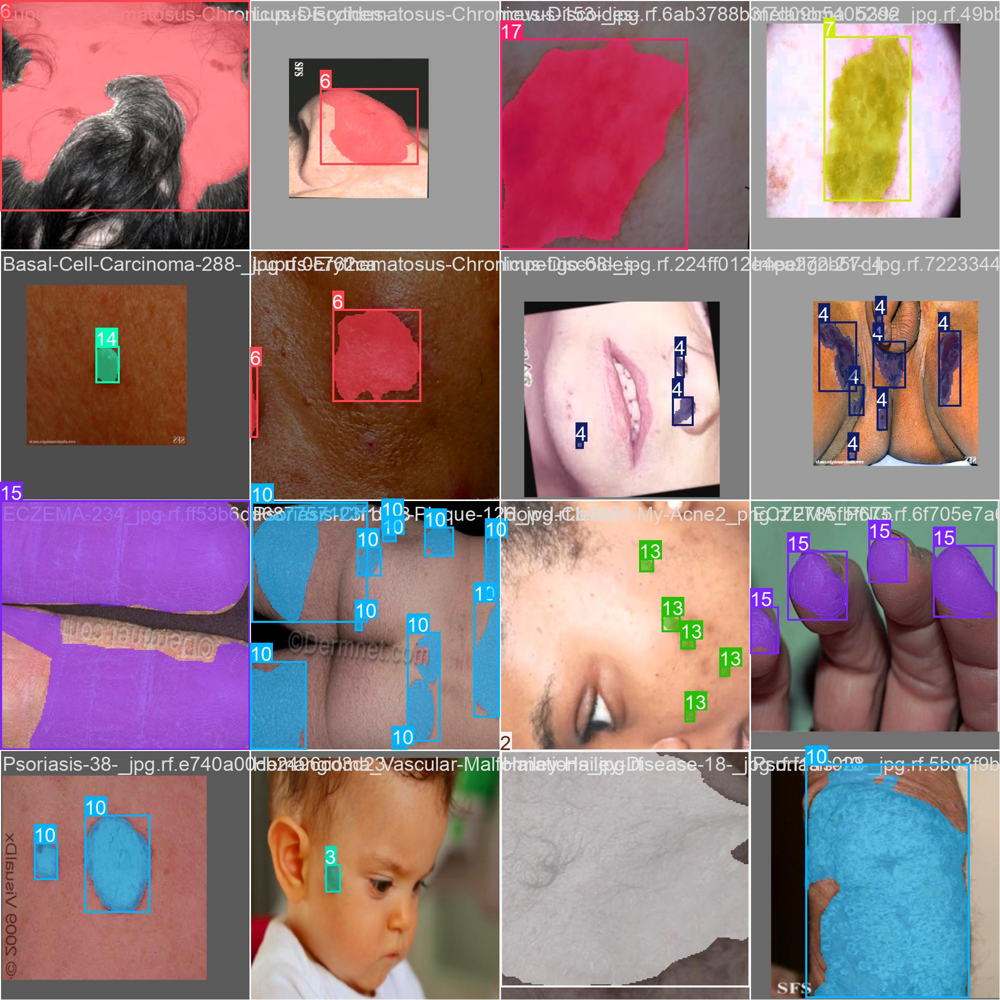

In [ ]:
Image(filename='/content/runs/segment/train/train_batch0.jpg', width=700)

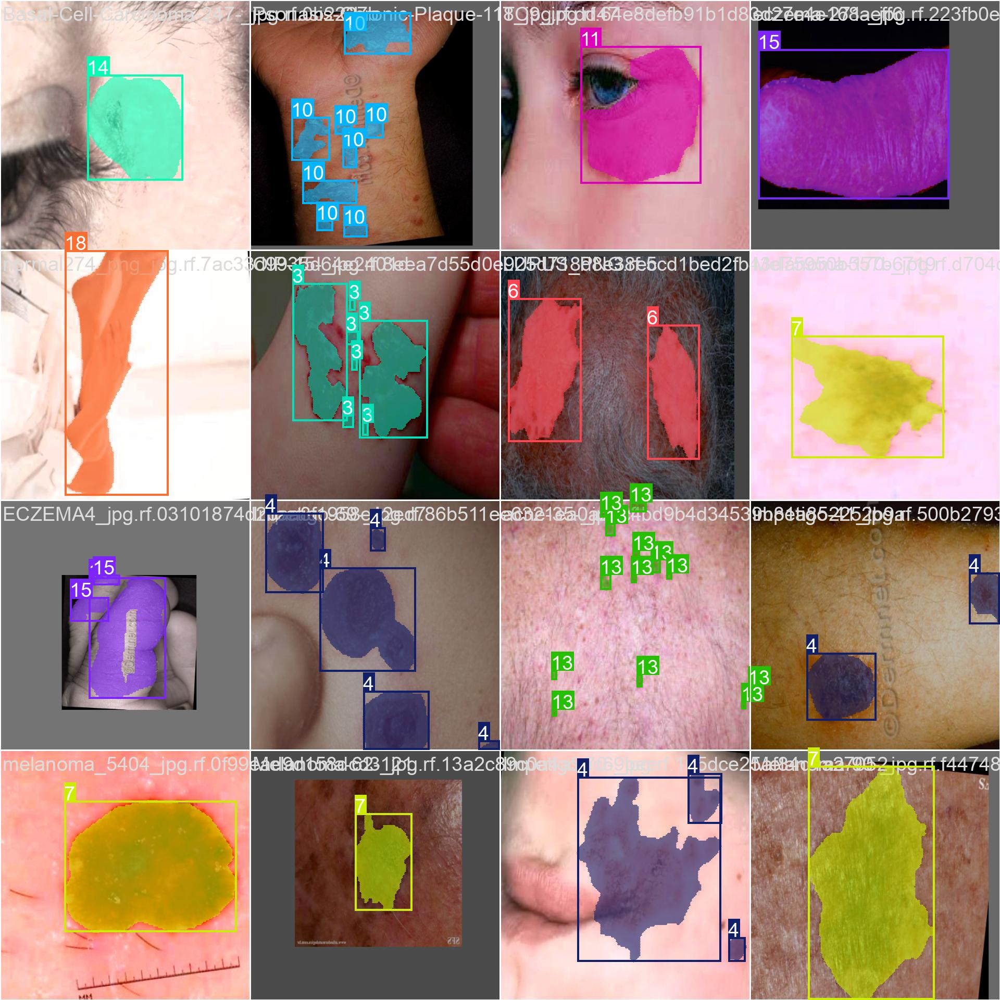

In [ ]:
Image(filename='/content/runs/segment/train/train_batch1.jpg', width=700)

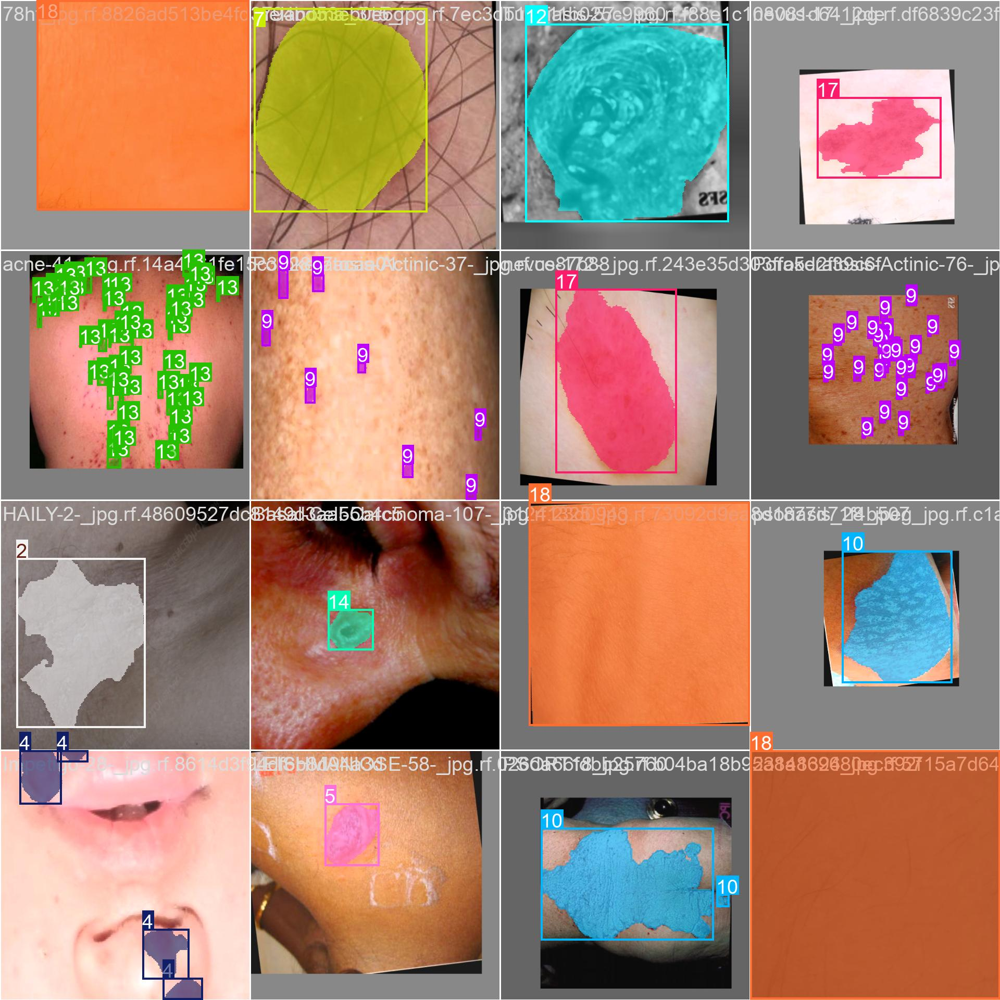

In [ ]:
Image(filename='/content/runs/segment/train/train_batch2.jpg', width=700)

# Validation batch

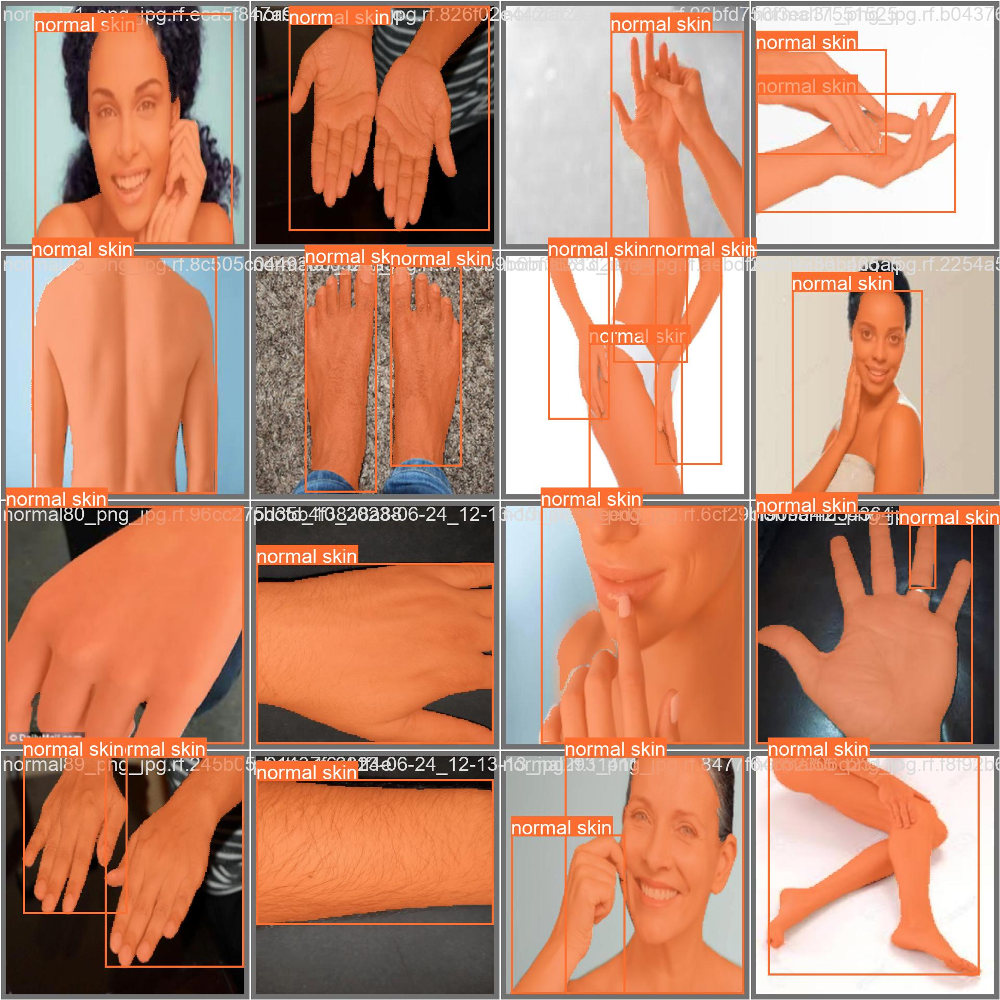

In [ ]:
Image(filename='/content/runs/segment/train/val_batch0_labels.jpg', width=700)

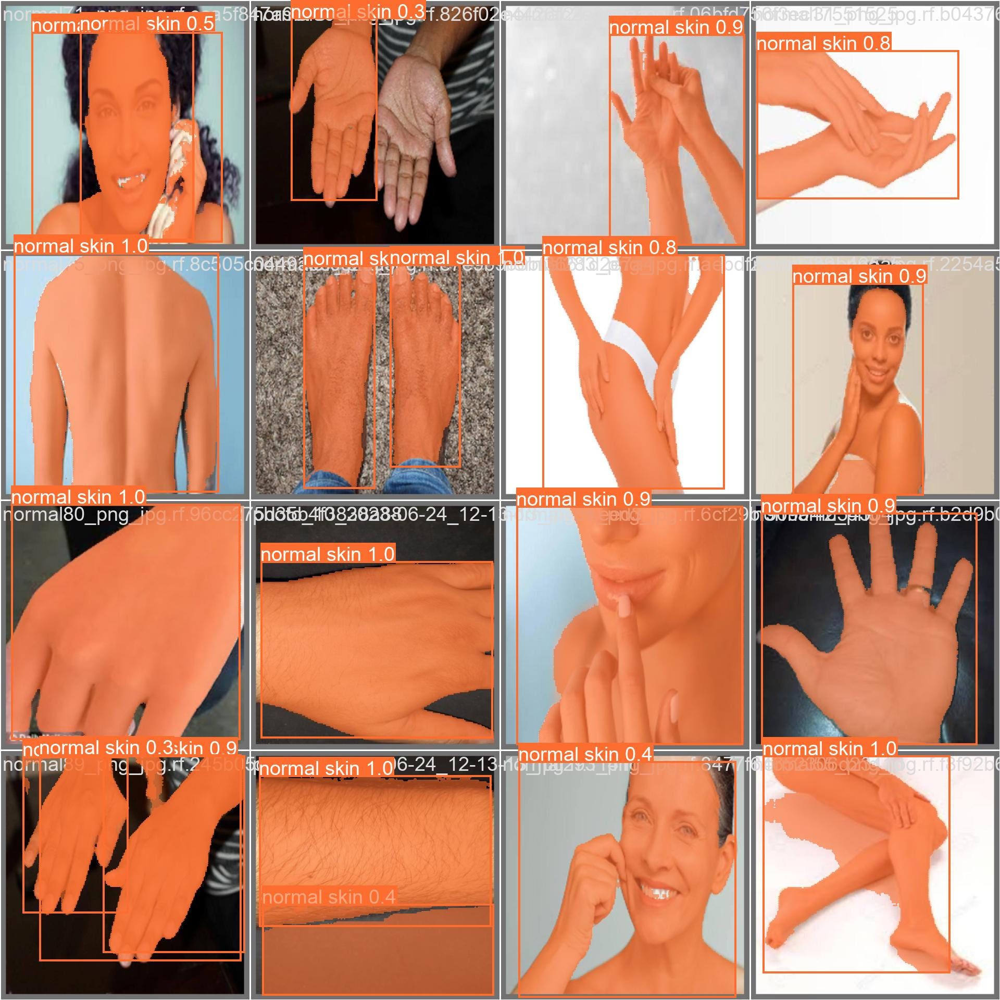

In [ ]:
Image(filename='/content/runs/segment/train/val_batch0_pred.jpg', width=700)

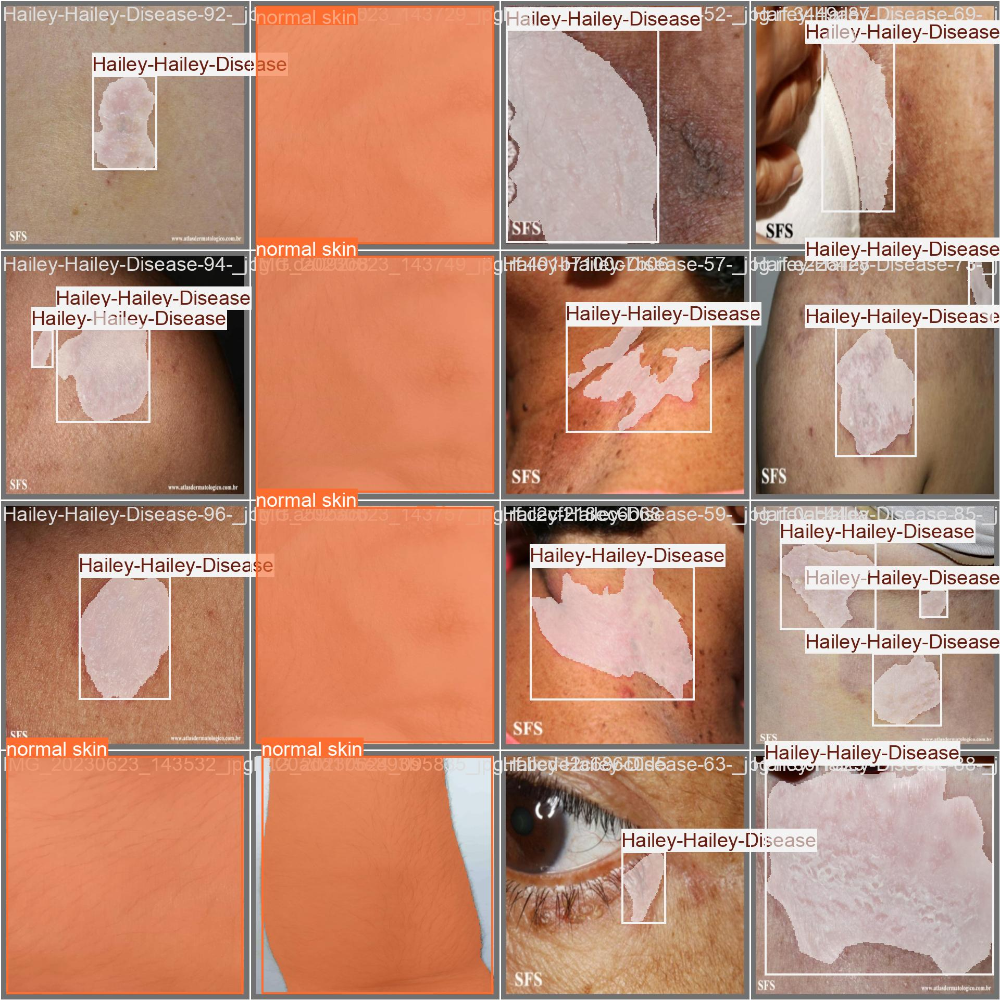

In [ ]:
Image(filename='/content/runs/segment/train/val_batch2_labels.jpg', width=700)

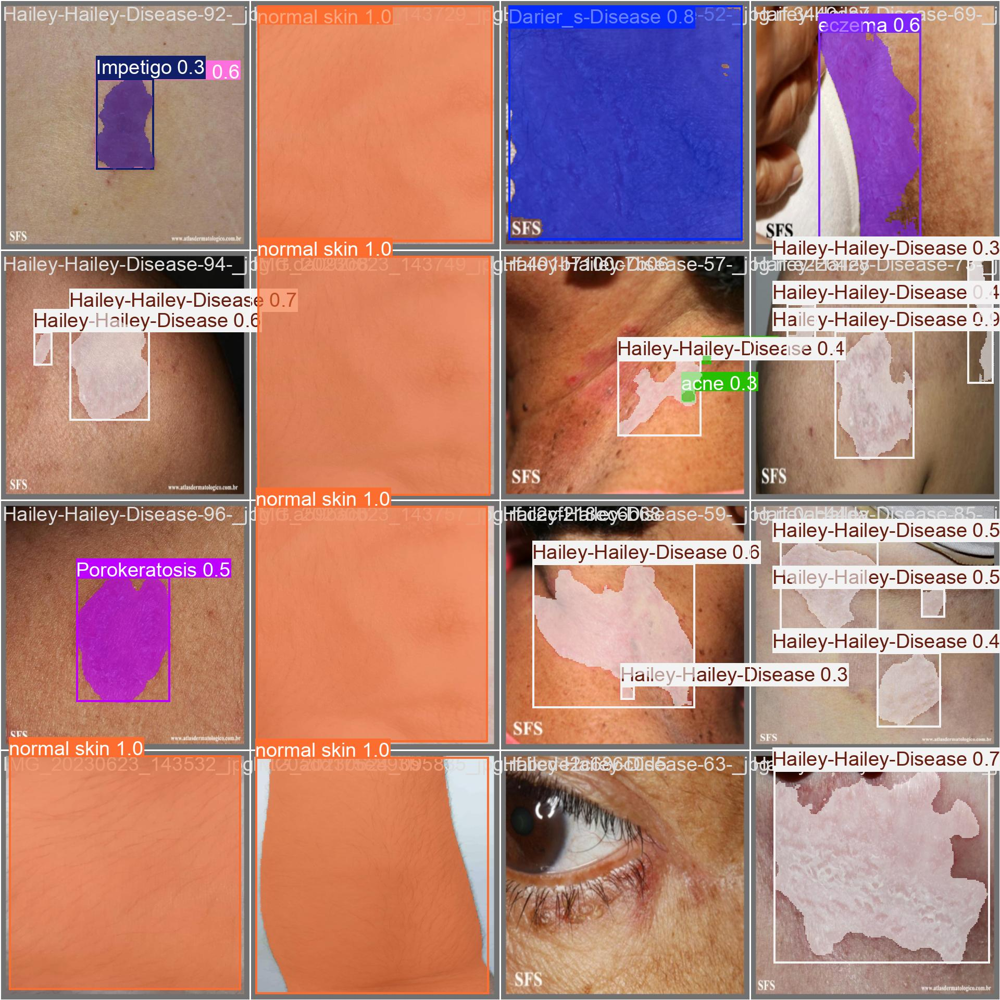

In [ ]:
Image(filename='/content/runs/segment/train/val_batch2_pred.jpg', width=700)

# model evaluate on test images


image 1/1 /content/skin-disease-dataset--38/test/images/12_jpg.rf.de03f29b3f7b538f00e4b058e4e9e65e.jpg: 640x640 1 normal skin, 13.3ms
Speed: 3.3ms preprocess, 13.3ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)


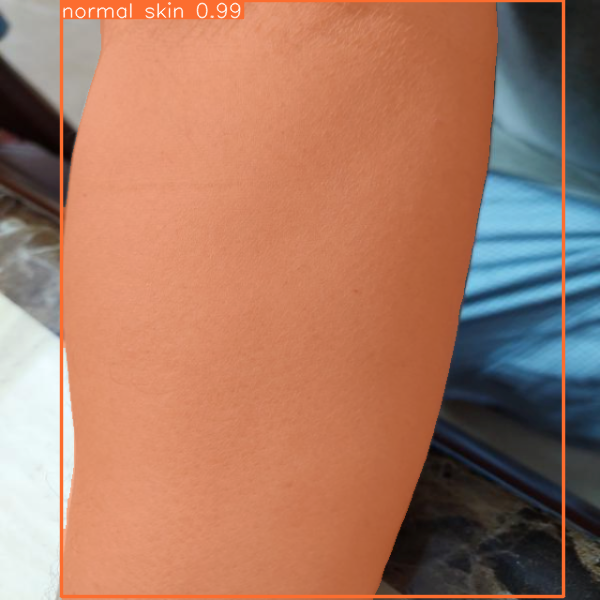

In [ ]:
test_model=YOLO('/content/runs/segment/train/weights/best.pt')

result=test_model('/content/skin-disease-dataset--38/test/images/12_jpg.rf.de03f29b3f7b538f00e4b058e4e9e65e.jpg')
result[0].show()


image 1/1 /content/skin-disease-dataset--38/test/images/766x415_Accutane_Side_Effects_jpg.rf.a1d00bce78688704d00ba53695429171.jpg: 640x640 2 acnes, 13.0ms
Speed: 4.8ms preprocess, 13.0ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


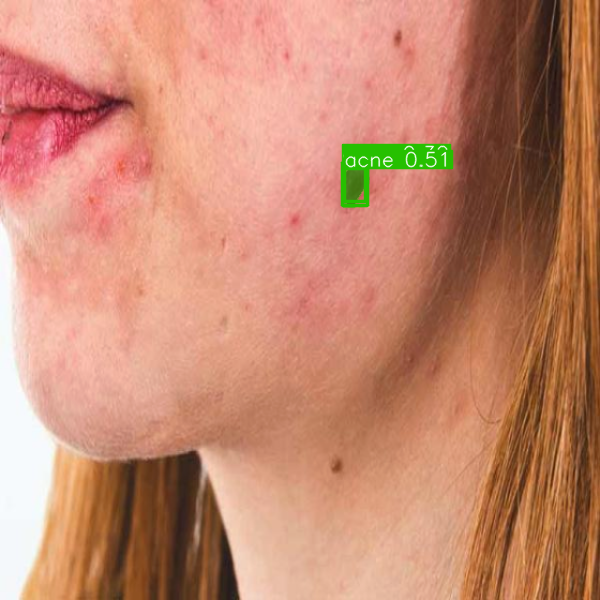

In [ ]:
result=test_model('/content/skin-disease-dataset--38/test/images/766x415_Accutane_Side_Effects_jpg.rf.a1d00bce78688704d00ba53695429171.jpg')
result[0].show()


image 1/1 /content/skin-disease-dataset--38/test/images/Basal-Cell-Carcinoma-306-_jpg.rf.6510a45e9502b7e264bcd20601b7f067.jpg: 640x640 1 basal-cell-carcinoma, 13.7ms
Speed: 4.7ms preprocess, 13.7ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)


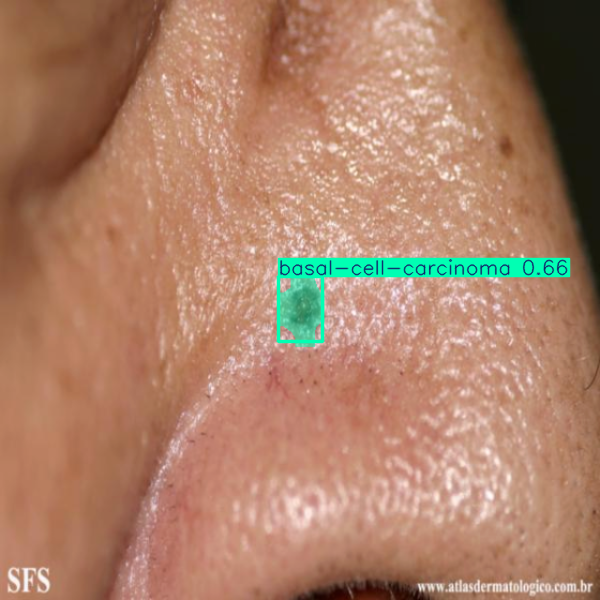

In [ ]:
result=test_model('/content/skin-disease-dataset--38/test/images/Basal-Cell-Carcinoma-306-_jpg.rf.6510a45e9502b7e264bcd20601b7f067.jpg')
result[0].show()


image 1/1 /content/skin-disease-dataset--38/test/images/Impetigo-16-_jpg.rf.96bfd069f5b4bf6cd4ce690491eac3d3.jpg: 640x640 1 eczema, 14.8ms
Speed: 3.7ms preprocess, 14.8ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)


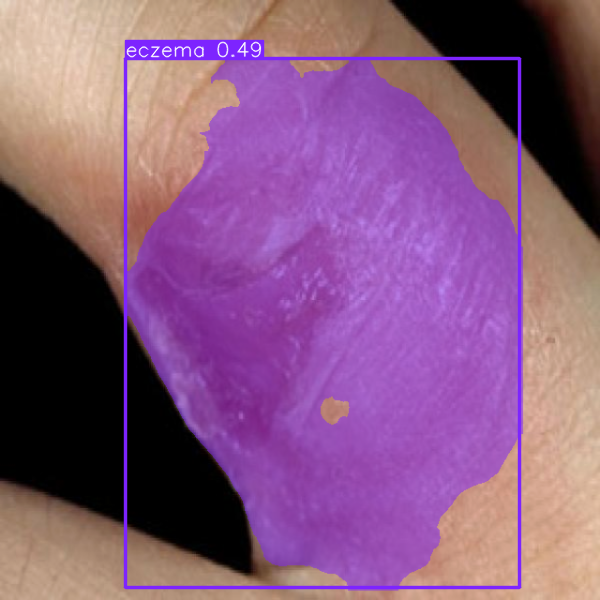

In [ ]:
result=test_model('/content/skin-disease-dataset--38/test/images/Impetigo-16-_jpg.rf.96bfd069f5b4bf6cd4ce690491eac3d3.jpg')
result[0].show()


image 1/1 /content/skin-disease-dataset--38/test/images/LEISHMANIOSE-6-_jpg.rf.f39e1cbc8bbc3c448893466fd38eb8b6.jpg: 640x640 1 Impetigo, 2 Leishmanioss, 48.8ms
Speed: 20.7ms preprocess, 48.8ms inference, 6.9ms postprocess per image at shape (1, 3, 640, 640)


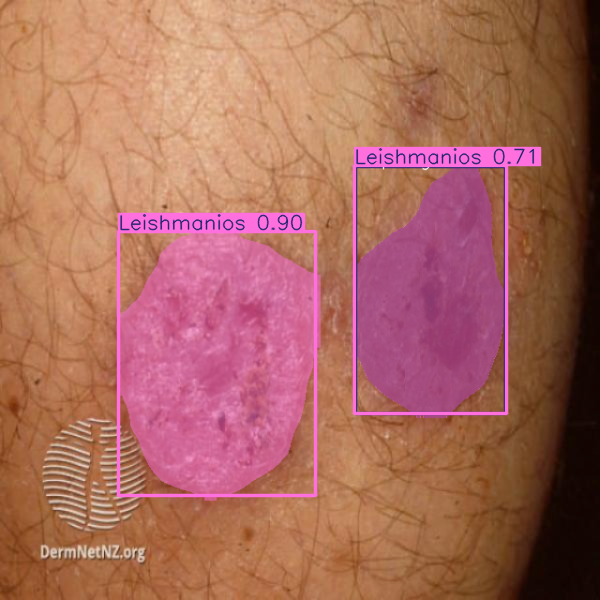

In [ ]:
result=test_model('/content/skin-disease-dataset--38/test/images/LEISHMANIOSE-6-_jpg.rf.f39e1cbc8bbc3c448893466fd38eb8b6.jpg')
result[0].show()


image 1/1 /content/skin-disease-dataset--38/test/images/Lupus-Erythematosus-Chronicus-Discoides-13-_jpg.rf.cee33d81dfa4f3a62e93364ea433df3b.jpg: 640x640 1 Darier_s-Disease, 1 Hailey-Hailey-Disease, 98.2ms
Speed: 16.1ms preprocess, 98.2ms inference, 9.8ms postprocess per image at shape (1, 3, 640, 640)


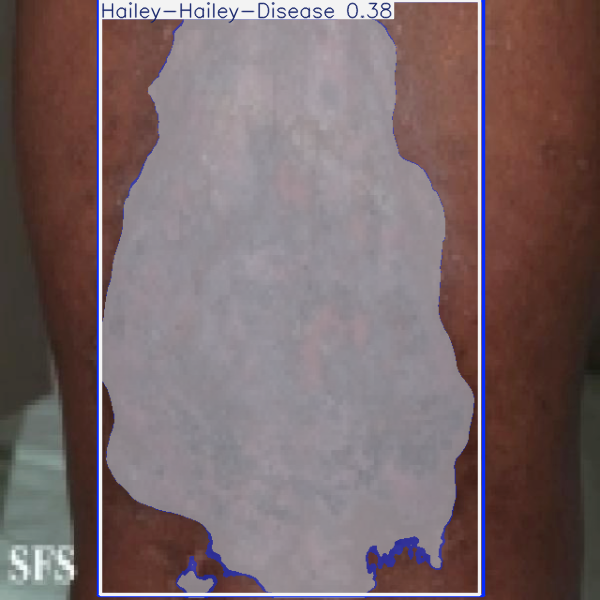

In [ ]:
result=test_model('/content/skin-disease-dataset--38/test/images/Lupus-Erythematosus-Chronicus-Discoides-13-_jpg.rf.cee33d81dfa4f3a62e93364ea433df3b.jpg')
result[0].show()


image 1/1 /content/skin-disease-dataset--38/test/images/Molluscum-Contagiosum-60-_jpg.rf.4f043c6493bb67bdbc0e9f2bc3e1138b.jpg: 640x640 4 Molluscum-Contagiosums, 30.5ms
Speed: 5.9ms preprocess, 30.5ms inference, 3.5ms postprocess per image at shape (1, 3, 640, 640)


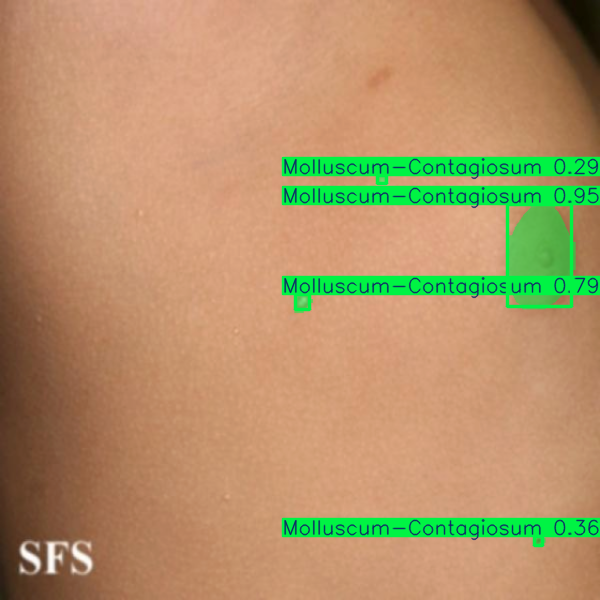

In [ ]:
result=test_model('/content/skin-disease-dataset--38/test/images/Molluscum-Contagiosum-60-_jpg.rf.4f043c6493bb67bdbc0e9f2bc3e1138b.jpg')
result[0].show()

# Test our model on random google images


image 1/1 /content/acne1.jpg: 448x640 18 acnes, 111.3ms
Speed: 4.6ms preprocess, 111.3ms inference, 3.4ms postprocess per image at shape (1, 3, 448, 640)


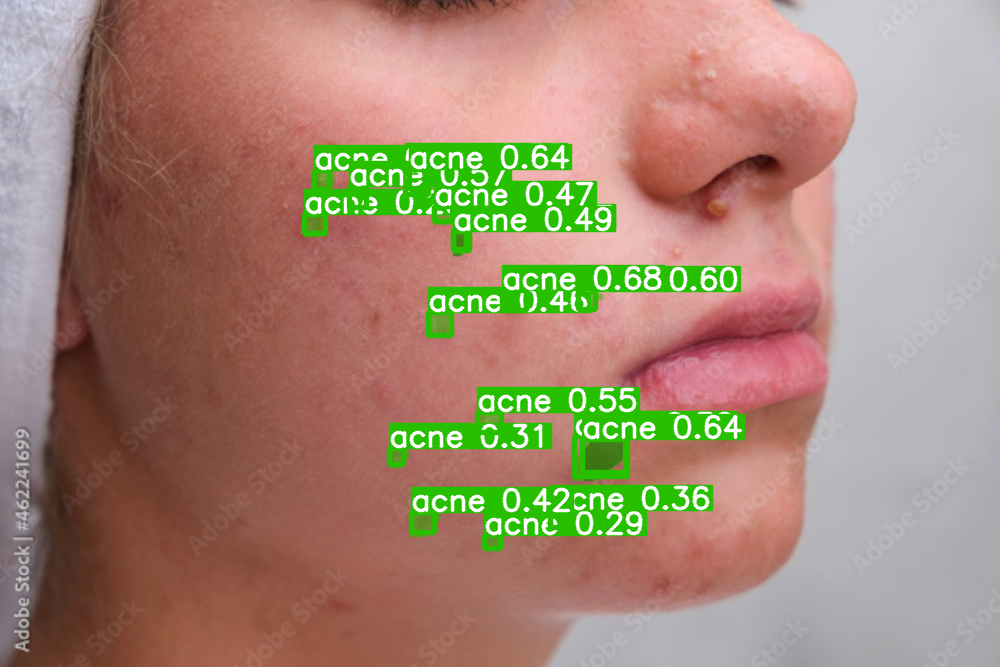

In [ ]:
rand_model=YOLO('/content/runs/segment/train/weights/best.pt')

rand_result=rand_model('/content/acne1.jpg')
rand_result[0].show()


image 1/1 /content/th.jpg: 640x512 2 Tinea-Corporiss, 62.8ms
Speed: 5.0ms preprocess, 62.8ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 512)


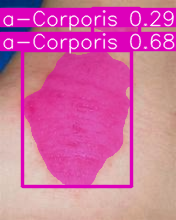

In [ ]:
rand_result=rand_model('/content/th.jpg')
rand_result[0].show()


image 1/1 /content/tongisas.jpg: 512x640 1 Tungiasis, 15.5ms
Speed: 3.4ms preprocess, 15.5ms inference, 3.3ms postprocess per image at shape (1, 3, 512, 640)


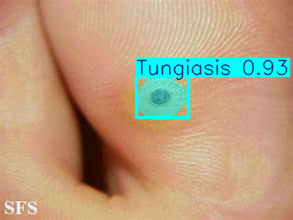

In [ ]:
rand_result=rand_model('/content/tongisas.jpg')
rand_result[0].show()